In [1]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import rcParams
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
from scipy.stats import zscore
from sklearn.impute import KNNImputer
from scipy.spatial import distance
from scipy.interpolate import interp1d
from scipy import stats
from scipy.stats import chi2
from scipy.spatial.distance import mahalanobis
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

In [3]:
from pathlib import Path
print(Path.cwd())

from os import walk

#This is the folder path, replace to your own local path
dir_path = r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Sang_Code_Processing_2024\0. Raw data\Year 4Final\Desigo\Zone CO2'

file_list = []
for (dir_path, dir_names, file_names) in walk(dir_path):
    file_list.extend(file_names)
    # don't look inside any subdirectory
    break
print(file_list)

c:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Code Year4
['HZ_Z11_CO2_060123-053124_raw.csv', 'HZ_Z12+13_CO2_060123-053124_raw.csv', 'HZ_Z15+16_CO2_060123-053124_raw.csv', 'HZ_Z17_CO2_060123-053124_raw.csv', 'HZ_Z1_CO2_060123-053124_raw.csv', 'HZ_Z21_CO2_060123-053124_raw.csv', 'HZ_Z22+23_CO2_060123-053124_raw.csv', 'HZ_Z24_CO2_060123-053124_raw.csv', 'HZ_Z25+26+27_CO2_060123-053124_raw.csv', 'HZ_Z31_CO2_060123-053124_raw.csv', 'HZ_Z32_CO2_060123-053124_raw.csv', 'HZ_Z33_CO2_060123-053124_raw.csv', 'HZ_Z3_CO2_060123-053124_raw.csv', 'HZ_Z4_CO2_060123-053124_raw.csv', 'HZ_Z5_CO2_060123-053124_raw.csv']


In [4]:
# IMPORTANT: If you get an error in reading the files do the following:
import os
Lst = []
for i in range(0, len(file_list)):
    # Construct the full path for each file
    file_path = os.path.join(dir_path, file_list[i])
    # Use the full path to read the CSV file
    data = pd.read_csv(file_path, parse_dates=['Timestamp'], index_col=[0])
    filtered_df = data[data['QualityGood'] == True]
    print(len(filtered_df))
    Lst.append(filtered_df)

527277
527277
527277
527276
527277
527277
527275
527275
527268
527268
527268
527267
527277
527277
527277


In [5]:
Lst_CO2 = []
Lst_name = []
#Initialize an empty DataFrame to compile resampled data from each DataFrame in Lst
Zone_CO2 = pd.DataFrame()
res = 1
#This part will take care of timestamp corrections, ensuring the output is always EST!
for i in range(0,len(Lst)):
    #Convert the index of the current DataFrame to datetime format with UTC timezone
    Lst[i].index = pd.to_datetime(Lst[i].index, errors='coerce', utc=True, format='mixed')
    #Convert the timezone of the index from UTC to US/Eastern
    Lst[i].index = Lst[i].index.tz_convert('US/Eastern')
    #Resample the DataFrame to a 1-minute frequency using the mean for aggregation. (This is for analysis)
    #forward fill missing data resulting from the resampling.
    Lst[i] = Lst[i].resample("1T").mean().ffill()
    #Extract the name of the first column of the DataFrame.
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    #Convert the specified column's data to numeric to ensure consistency for calculations.
    Z = pd.to_numeric(Lst[i][zone_name])
    Lst_CO2.append(Z.tolist())
    #Create a new column in 'Zone_CO2' with the name of the current zone.
    Zone_CO2[zone_name] = pd.Series(Z, index=Lst[i].index)
    
Zone_CO2

C:\Users\Sang\AppData\Local\Temp\ipykernel_26396\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_26396\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_26396\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_26396\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_26396\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version,

,Z11_CO2 (ppm),Z12+13_CO2 (ppm),Z15+16_CO2 (ppm),Z17_CO2 (ppm),Z1_CO2 (ppm),Z21_CO2 (ppm),Z22+23_CO2 (ppm),Z24_CO2 (ppm),Z25+26+27_CO2 (ppm),Z31_CO2 (ppm),Z32_CO2 (ppm),Z33_CO2 (ppm),Z3_CO2 (ppm),Z4_CO2 (ppm),Z5_CO2 (ppm)
Timestamp,,,,,,,,,,,,,,,
2023-06-01 00:00:00-04:00,433.600006,426.559998,453.119995,521.919983,428.799988,448.640015,433.920013,563.200012,427.519989,390.079987,473.279999,437.440002,580.479980,516.159973,496.320007
2023-06-01 00:01:00-04:00,432.640015,423.679993,453.760010,521.919983,428.799988,448.640015,433.920013,564.159973,426.239990,390.079987,473.279999,437.760010,580.479980,516.159973,487.679993
2023-06-01 00:02:00-04:00,432.640015,423.679993,453.760010,521.919983,428.799988,448.640015,433.920013,564.159973,426.239990,390.079987,473.279999,440.000000,580.479980,516.159973,487.679993
2023-06-01 00:03:00-04:00,432.640015,423.679993,453.760010,521.919983,428.799988,448.640015,433.920013,553.919983,426.239990,390.079987,473.279999,439.679993,590.719971,516.159973,487.679993
2023-06-01 00:04:00-04:00,432.640015,423.679993,443.519989,521.919983,435.519989,448.640015,433.920013,544.000000,426.239990,390.079987,473.279999,437.760010,590.719971,516.159973,487.679993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-31 23:55:00-04:00,451.200012,453.119995,473.600006,537.599976,450.880005,439.679993,434.239990,594.880005,456.640015,390.079987,482.880005,453.760010,451.519989,464.320007,589.760010
2024-05-31 23:56:00-04:00,440.959991,453.119995,473.600006,537.599976,450.880005,439.679993,434.239990,594.880005,456.640015,390.079987,482.880005,454.720001,451.519989,464.320007,589.760010
2024-05-31 23:57:00-04:00,430.720001,453.119995,473.600006,537.599976,443.839996,439.679993,434.239990,594.880005,456.640015,390.079987,482.880005,455.040009,450.880005,463.040009,589.760010


<Axes: xlabel='Timestamp'>

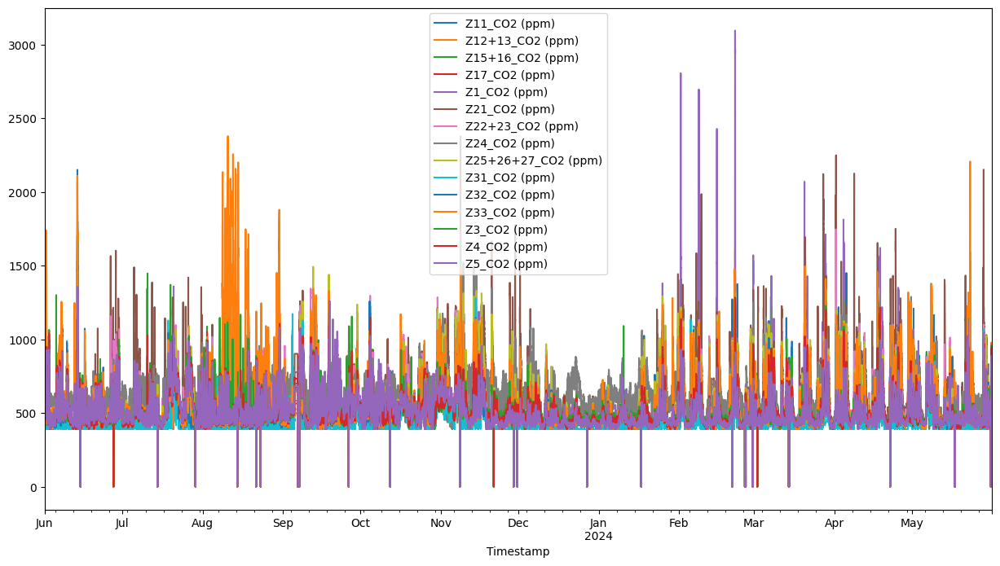

In [6]:
Zone_CO2.plot(figsize=(15, 8))

In [7]:
#Initialize lists for storing differences and names (Difference Analysis)
Lst_diff = []
Lst_name = []
#Loop through each DataFrame to calculate and store differences in data.
for i in range(0,len(Lst)):
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    Z = pd.to_numeric(Lst[i][zone_name])
    #Calculate the difference between consecutive data points.
    temp = Z.diff()
    #Store the differences, excluding the last one, and sorting to facilitate analysis (2000 most significant differences).
    Lst_diff.append(temp.sort_values(ascending=True)[-2000:-1].tolist())
    
# print (Lst_diff)
#Restructure the dataframe for visual analysis
df = pd.DataFrame(Lst_diff).transpose()

df.columns = Lst_name
df   

,Z11_CO2 (ppm),Z12+13_CO2 (ppm),Z15+16_CO2 (ppm),Z17_CO2 (ppm),Z1_CO2 (ppm),Z21_CO2 (ppm),Z22+23_CO2 (ppm),Z24_CO2 (ppm),Z25+26+27_CO2 (ppm),Z31_CO2 (ppm),Z32_CO2 (ppm),Z33_CO2 (ppm),Z3_CO2 (ppm),Z4_CO2 (ppm),Z5_CO2 (ppm)
0,11.519989,10.240051,11.839966,10.240051,12.159973,16.000000,11.200012,30.719971,10.880005,12.799988,10.240051,14.400024,11.839996,10.880005,10.560028
1,11.519989,10.240051,11.839966,10.240051,12.159973,16.000000,11.200012,30.719971,10.880005,12.799988,10.240051,14.400024,11.839996,10.880005,10.560028
2,11.519989,10.240051,11.839966,10.240051,12.159973,16.000000,11.200012,30.719971,10.880005,12.799988,10.240051,14.400024,11.839996,10.880005,10.560028
3,11.519989,10.240051,11.839966,10.240051,12.159973,16.000000,11.200012,30.719971,10.880005,12.799988,10.240051,14.400024,11.839996,10.880005,10.560028
4,11.519989,10.240051,11.839966,10.240051,12.159973,16.000000,11.200012,30.719971,10.880005,12.799988,10.240051,14.400024,11.839996,10.880005,10.560028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1994,667.520020,651.520020,671.359985,657.280029,657.919983,589.760010,649.919983,658.559998,663.679993,444.799988,634.559998,611.520020,633.280029,622.080017,593.599976
1995,669.440002,659.200012,677.760010,682.239990,695.039978,634.880005,670.080017,663.039978,663.679993,458.559998,640.640015,656.000000,636.159973,623.359985,596.159973
1996,672.000000,699.520020,711.039978,696.960022,725.119995,689.280029,701.440002,717.440002,680.960022,478.399994,666.880005,658.559998,659.200012,672.640015,608.000000
1997,681.599976,728.320007,808.960022,703.359985,728.960022,707.200012,740.479980,774.400024,722.559998,480.000000,667.520020,677.119995,706.559998,720.640015,696.320007


<Axes: >

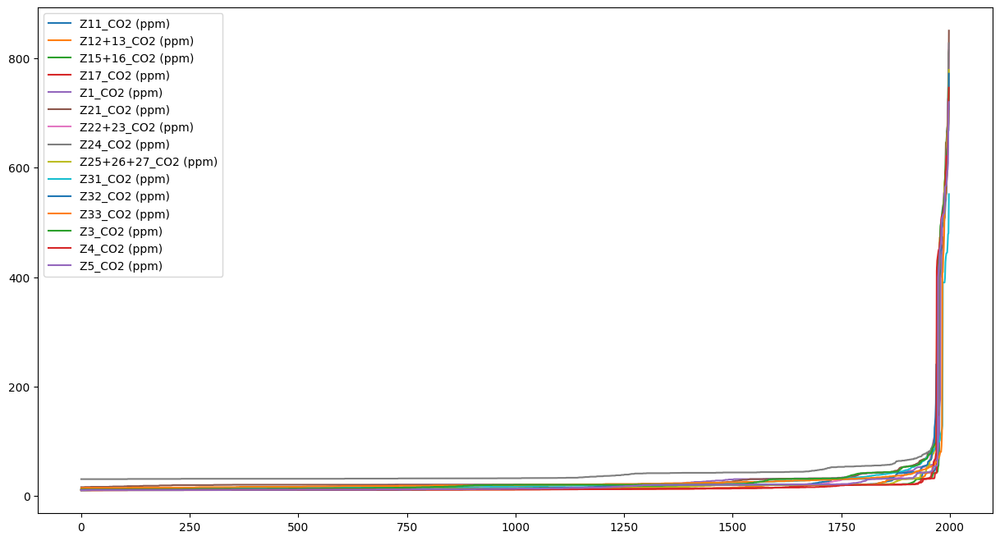

In [8]:
df.plot(figsize=(15, 8))

In [9]:
#Observe the .8 quantile (where 80% of the differences lie in)
df.quantile(0.8)

Z11_CO2 (ppm)          20.479980
Z12+13_CO2 (ppm)       19.840027
Z15+16_CO2 (ppm)       20.479980
Z17_CO2 (ppm)          15.359985
Z1_CO2 (ppm)           31.359985
Z21_CO2 (ppm)          30.720093
Z22+23_CO2 (ppm)       21.119995
Z24_CO2 (ppm)          43.520020
Z25+26+27_CO2 (ppm)    20.479980
Z31_CO2 (ppm)          26.368066
Z32_CO2 (ppm)          21.119995
Z33_CO2 (ppm)          26.879968
Z3_CO2 (ppm)           30.719971
Z4_CO2 (ppm)           15.039978
Z5_CO2 (ppm)           20.799988
Name: 0.8, dtype: float64

In [10]:
# Update 'Lst_name' to contain the names of columns
Lst_name = Zone_CO2.columns.values

Absolute Difference

In [11]:
Zone_CO2.describe()

,Z11_CO2 (ppm),Z12+13_CO2 (ppm),Z15+16_CO2 (ppm),Z17_CO2 (ppm),Z1_CO2 (ppm),Z21_CO2 (ppm),Z22+23_CO2 (ppm),Z24_CO2 (ppm),Z25+26+27_CO2 (ppm),Z31_CO2 (ppm),Z32_CO2 (ppm),Z33_CO2 (ppm),Z3_CO2 (ppm),Z4_CO2 (ppm),Z5_CO2 (ppm)
count,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000,527040.000000
mean,518.802472,518.236438,531.086121,513.415935,528.737843,564.543347,539.698115,595.710276,543.502683,460.625511,522.963981,546.456564,519.277562,517.364167,512.079986
std,130.913173,126.270021,132.263267,121.506881,142.995308,191.727709,156.807207,140.067789,163.092072,130.459640,137.863075,182.587621,105.199879,112.518581,110.934942
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,437.119995,434.239990,445.760010,433.279999,441.920013,434.239990,431.040009,495.359985,435.519989,390.079987,432.320007,435.839996,451.519989,444.480011,436.160004
50%,471.359985,472.640015,485.760010,471.040009,485.760010,491.519989,479.679993,574.400024,481.279999,390.079987,475.200012,481.920013,487.679993,480.959991,473.600006
75%,557.760010,565.440002,572.479980,552.000000,568.960022,631.679993,601.280029,670.080017,592.640015,482.239990,569.919983,593.919983,554.880005,552.320007,559.039978
max,1798.400024,1758.719971,1734.400024,1600.000000,3095.040039,2376.959961,1745.920044,1728.000000,1733.119995,2064.639893,2150.399902,2378.239990,1446.400024,1281.920044,1356.800049


In [12]:
#If the absolute difference between consecutive values is greater than 100, drop them.
#IMPORTANT: Observe statistical summary to determine the abs diff condition.
for i in range(len(Lst_name)):
    col_name = Lst_name[i]
    df = Zone_CO2[col_name]
    #Drop rows where the difference exceeds 100
    to_drop = df[abs(df.diff()) > 100].index
    Zone_CO2[col_name] = df.drop(to_drop)
    #Apply linear interpolation to fill gaps
    Zone_CO2[col_name] = Zone_CO2[col_name].interpolate()

<Axes: xlabel='Timestamp'>

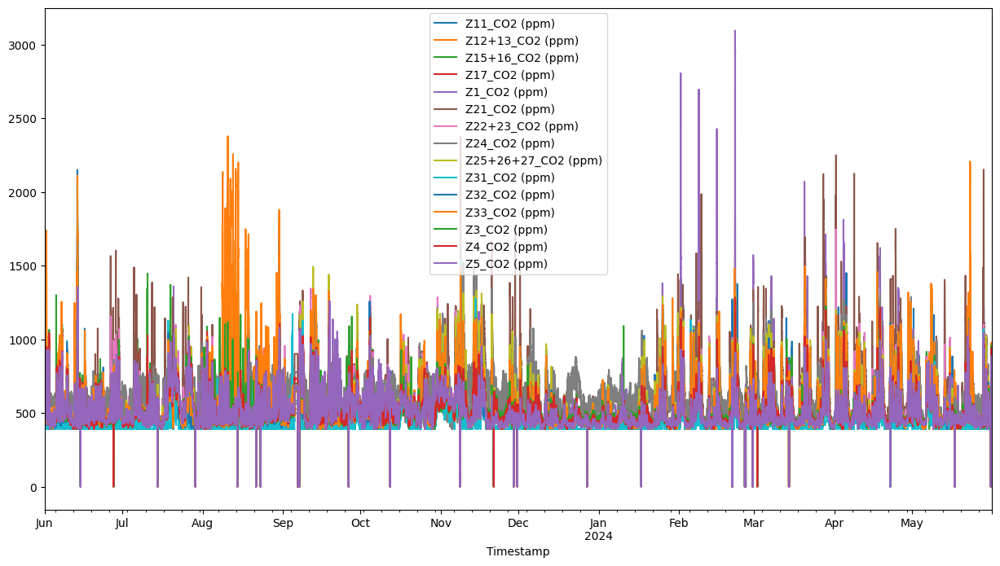

In [13]:
Zone_CO2.plot(figsize=(15, 8))

In [14]:
# #Using DBSCAN to remove outliers
# #Standardize the data
# data_scaled = StandardScaler().fit_transform(Zone_CO2)

# #Apply DBSCAN
# dbscan = DBSCAN(eps=1.0, min_samples=15)  # Adjust these parameters based on your data
# clusters = dbscan.fit_predict(data_scaled)

# #Replace outliers with np.nan
# Zone_CO2[clusters == -1] = np.nan

# #Plotting (assuming your DataFrame is set up correctly for plotting)
# Zone_CO2.plot(figsize=(15, 8))

C:\Users\Sang\AppData\Local\Temp\ipykernel_26396\1923515966.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[clusters == -1] = np.nan
C:\Users\Sang\AppData\Local\Temp\ipykernel_26396\1923515966.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[clusters == -1] = np.nan
C:\Users\Sang\AppData\Local\Temp\ipykernel_26396\1923515966.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

<Axes: xlabel='Timestamp'>

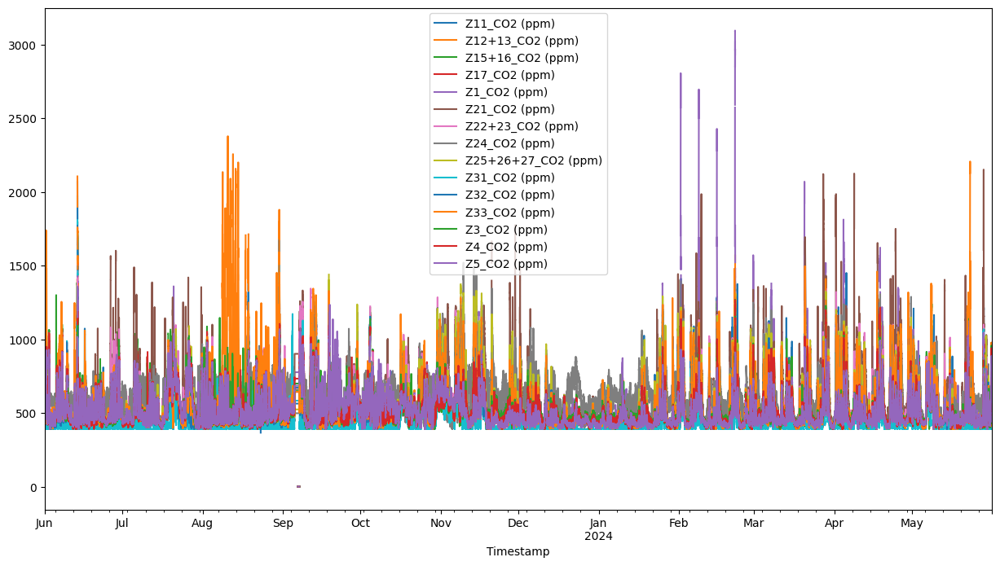

In [15]:
def process_batch(data, eps=1.0, min_samples=15):
    #Standardize the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit_predict(data_scaled)

    data[clusters == -1] = np.nan
    return data

#Number of batches
n_batches = 3

#Split the dataframe into batches
batch_size = len(Zone_CO2) // n_batches
batches = [Zone_CO2.iloc[i:i + batch_size] for i in range(0, len(Zone_CO2), batch_size)]

#Process each batch with DBSCAN
cleaned_batches = [process_batch(batch) for batch in batches]

#Combine the cleaned data back into a one dataframe
Zone_CO2_cleaned = pd.concat(cleaned_batches)

Zone_CO2_cleaned.plot(figsize=(15, 8))

In [16]:
Zone_CO2 = Zone_CO2_cleaned

C:\Users\Sang\AppData\Local\Temp\ipykernel_26396\1801476030.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  Zone_CO2 = Zone_CO2.resample("H").mean().ffill()


<Axes: xlabel='Timestamp'>

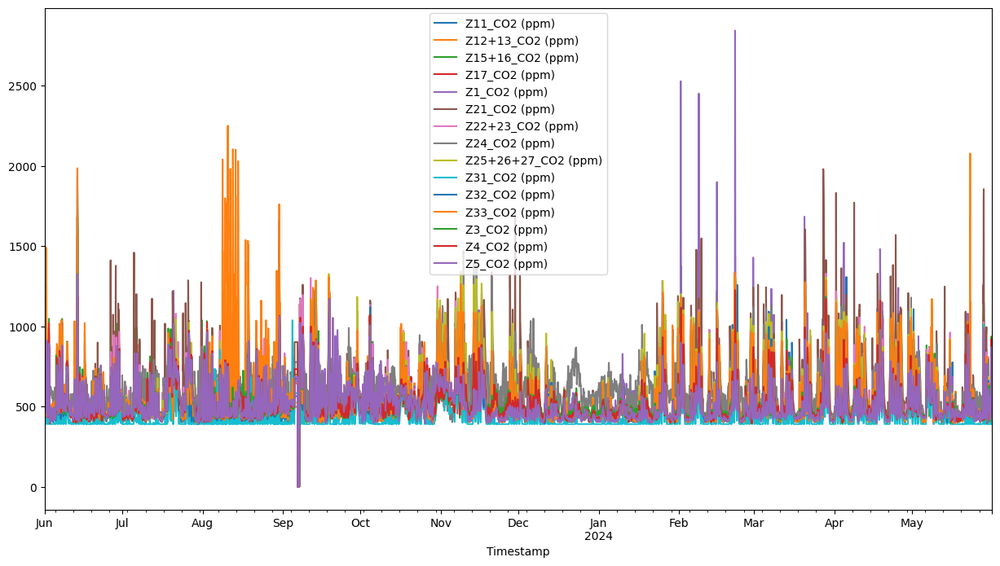

In [17]:
#Process to Hourly and forward fill (average to hour and forward fill to assign last existing value to a missing value)
Zone_CO2 = Zone_CO2.resample("H").mean().ffill()
Zone_CO2.plot(figsize=(15, 8))

In [18]:
Zone_CO2[Zone_CO2 < 100] = np.nan

In [19]:
Zone_CO2.describe()

,Z11_CO2 (ppm),Z12+13_CO2 (ppm),Z15+16_CO2 (ppm),Z17_CO2 (ppm),Z1_CO2 (ppm),Z21_CO2 (ppm),Z22+23_CO2 (ppm),Z24_CO2 (ppm),Z25+26+27_CO2 (ppm),Z31_CO2 (ppm),Z32_CO2 (ppm),Z33_CO2 (ppm),Z3_CO2 (ppm),Z4_CO2 (ppm),Z5_CO2 (ppm)
count,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000,8769.000000
mean,519.665321,519.103734,532.026841,514.374622,529.463415,565.444932,540.624000,596.490079,544.382605,461.025936,523.658225,547.167389,519.990314,518.169979,512.903950
std,128.072526,123.573838,129.667710,119.009478,139.733548,188.192718,154.213059,134.900657,160.661931,126.873903,134.577433,179.182090,101.315182,109.470474,107.813995
min,372.496284,392.138658,392.389325,393.546666,390.570655,391.039987,390.479988,329.133568,346.267136,367.282759,393.925331,391.735990,391.557322,390.997322,392.445323
25%,437.338666,434.624000,446.325335,433.562670,442.314668,434.469334,431.685334,497.920013,435.669331,390.079987,432.789335,436.304001,451.792003,445.258668,436.656001
50%,471.802665,472.826668,485.626669,471.392000,485.770668,491.904004,480.133335,574.586662,481.776000,392.490660,475.893332,482.976001,487.519999,481.210669,473.797334
75%,558.106667,565.429327,572.165328,550.933335,567.984000,631.434669,602.191304,667.370663,593.781335,481.999998,569.151999,593.946665,554.144004,551.719995,558.821337
max,1786.037893,1674.273698,1677.911592,1563.688422,2843.415823,1979.541341,1612.122336,1469.799294,1717.153670,1875.334736,1935.966318,2250.154659,1205.103140,1225.094749,1325.209587


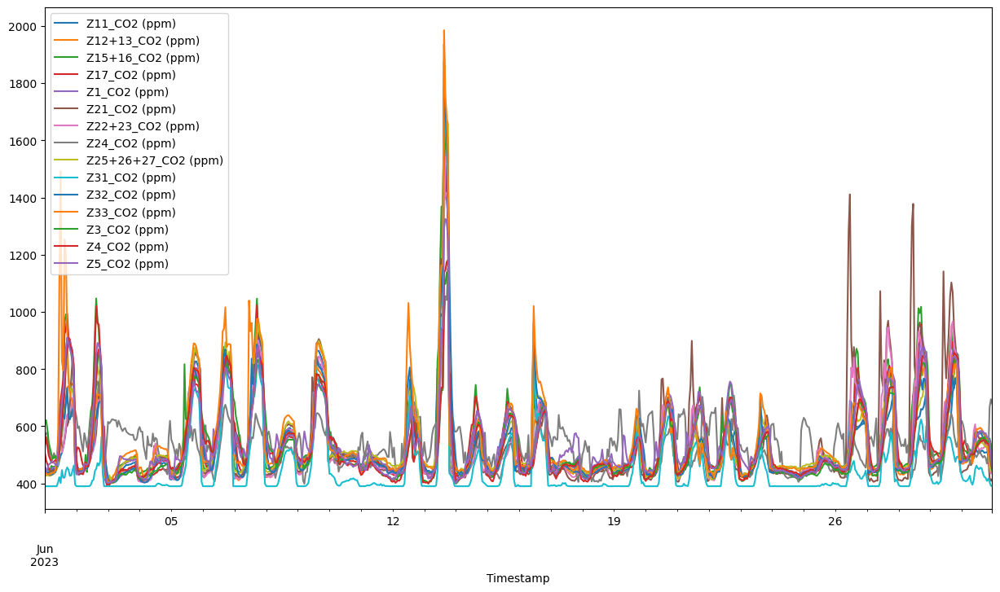

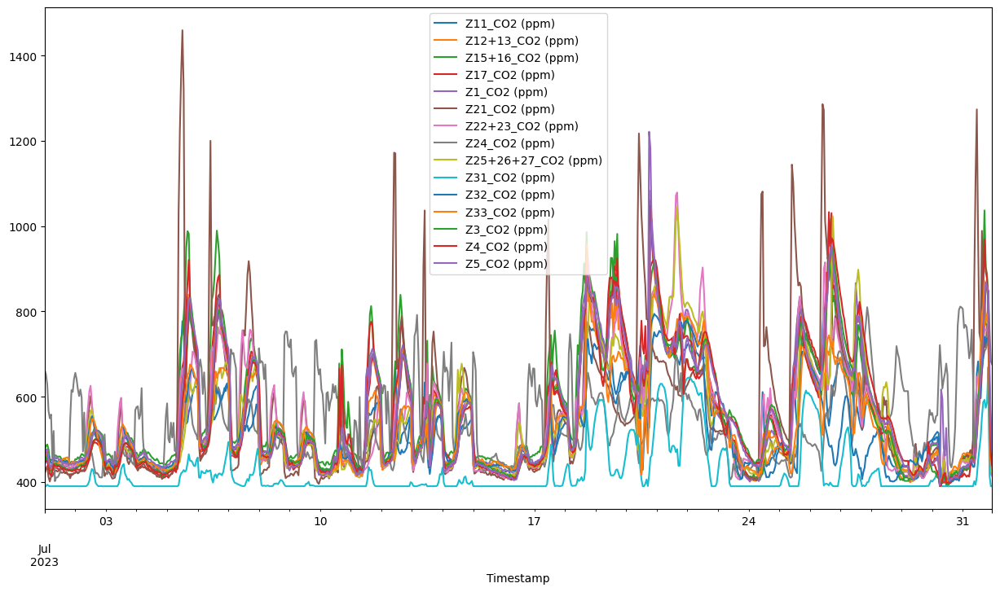

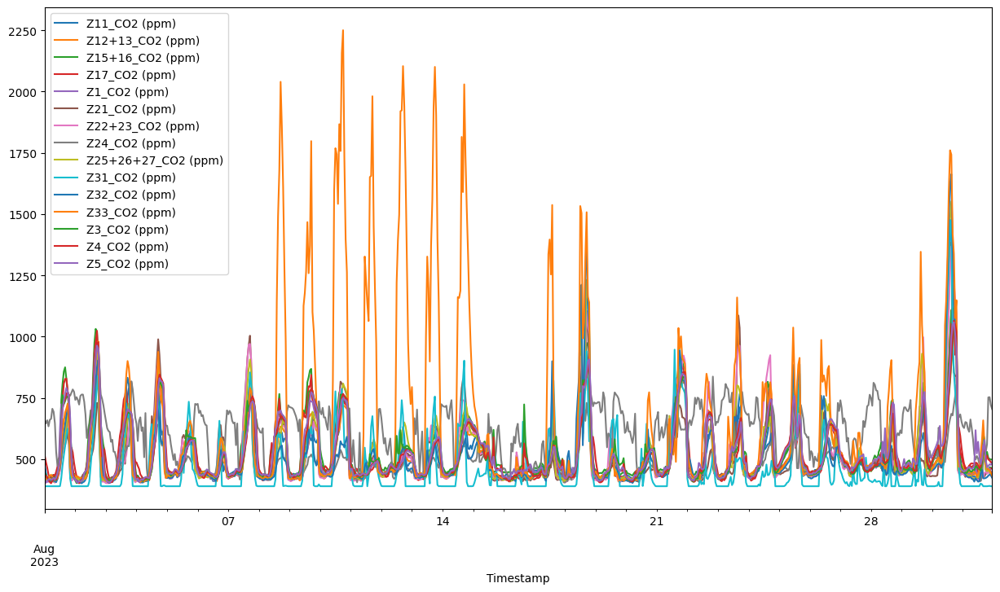

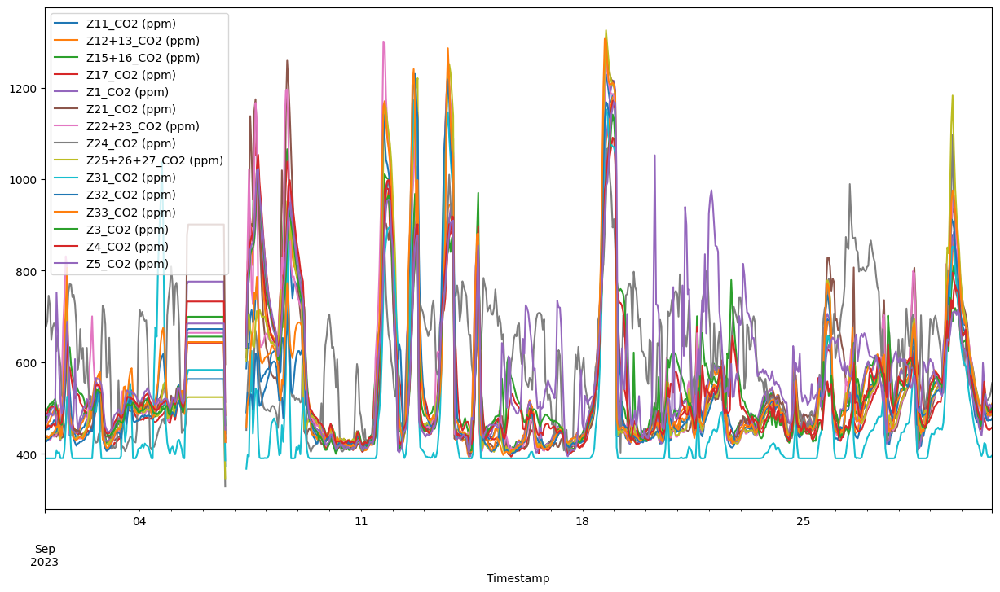

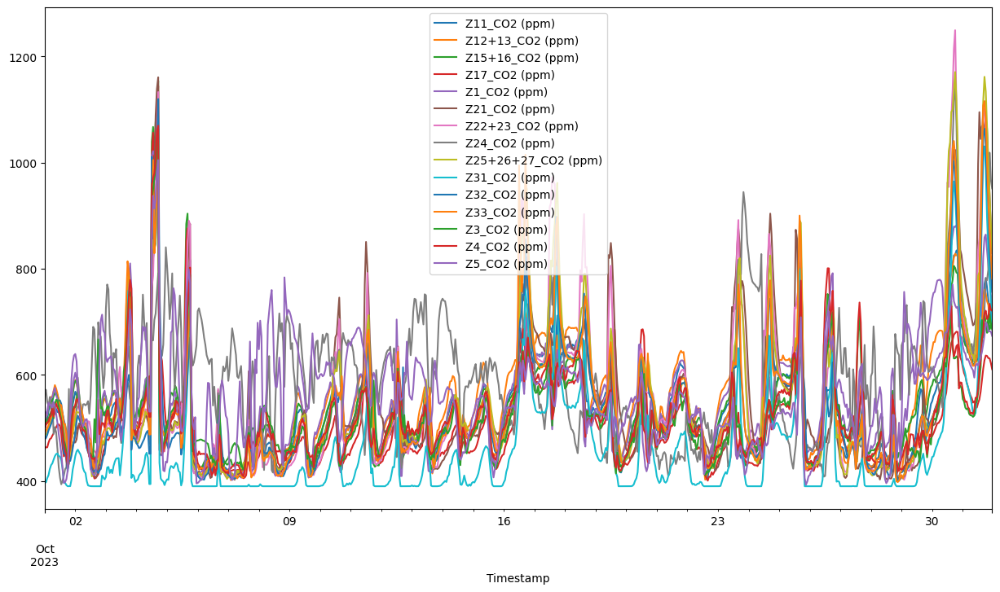

...

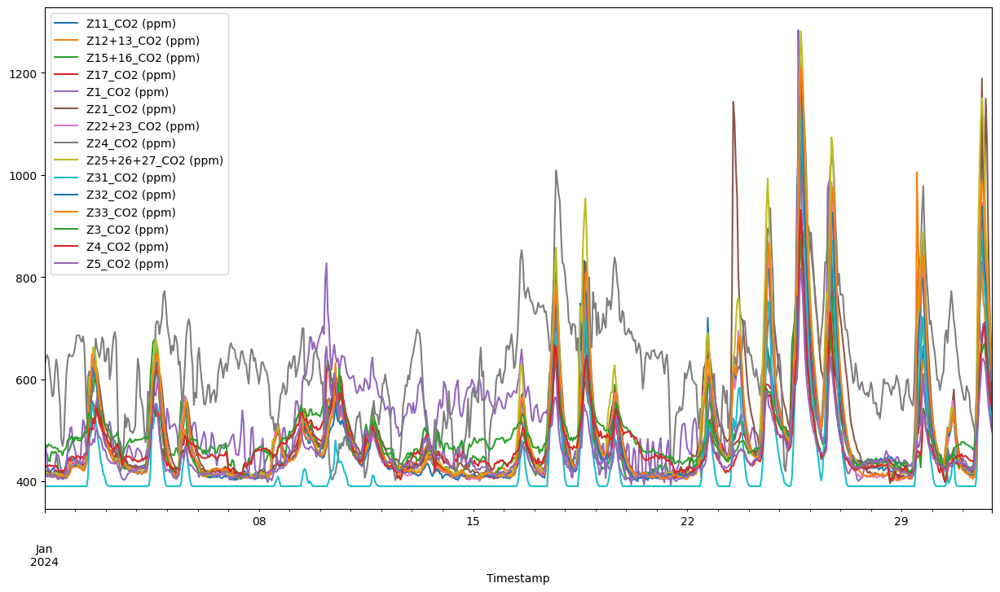

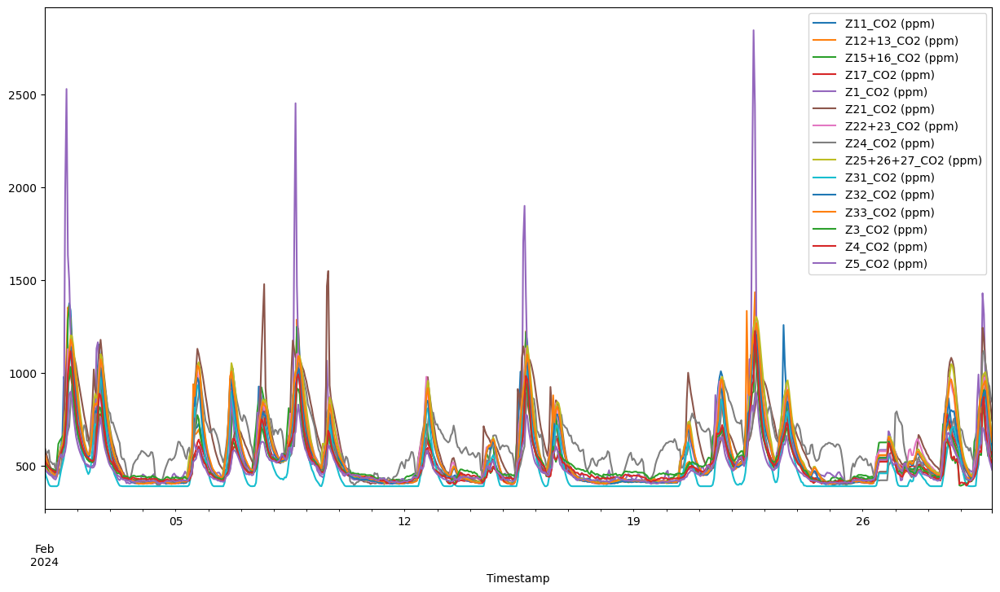

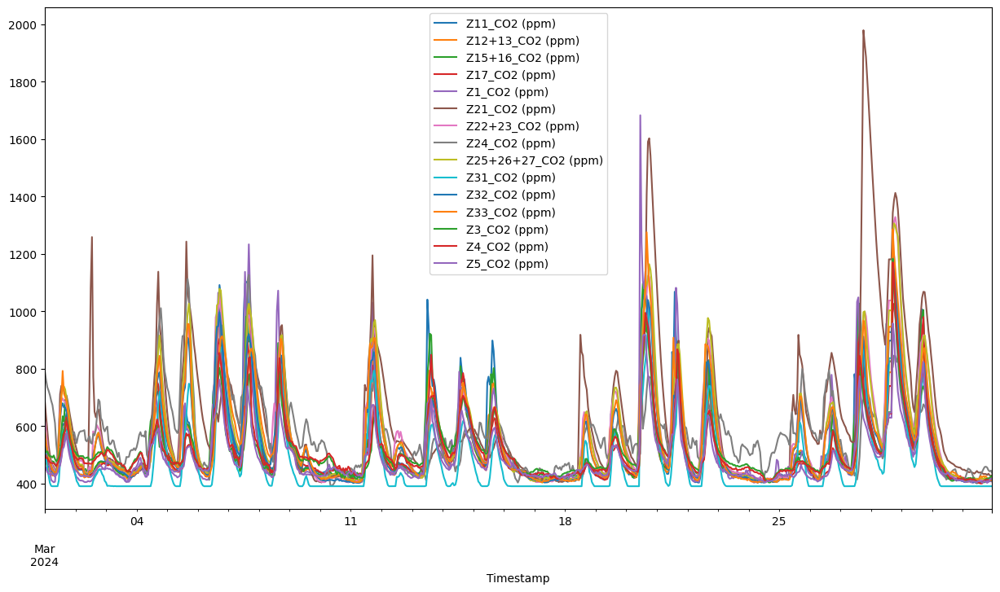

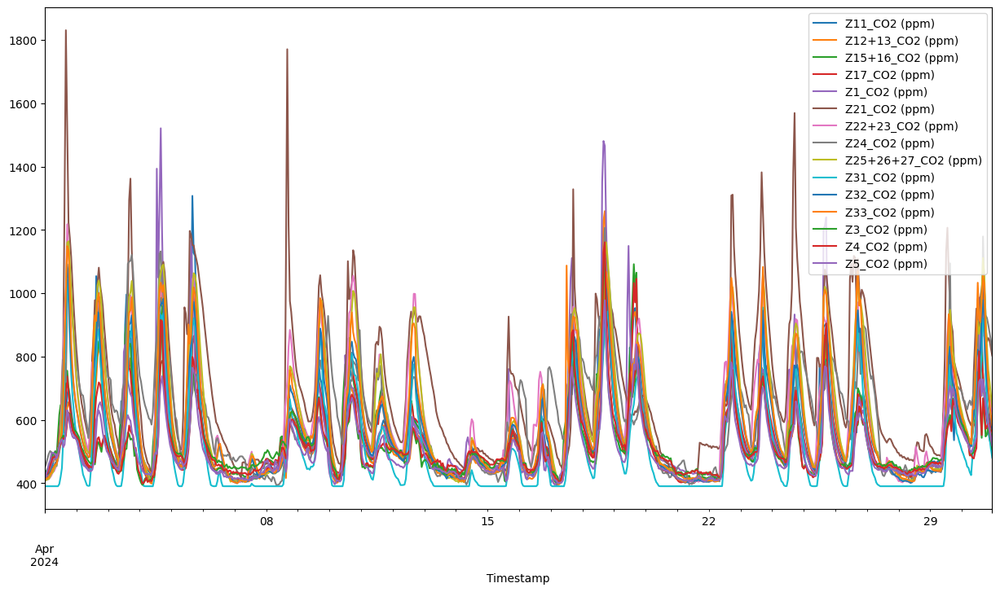

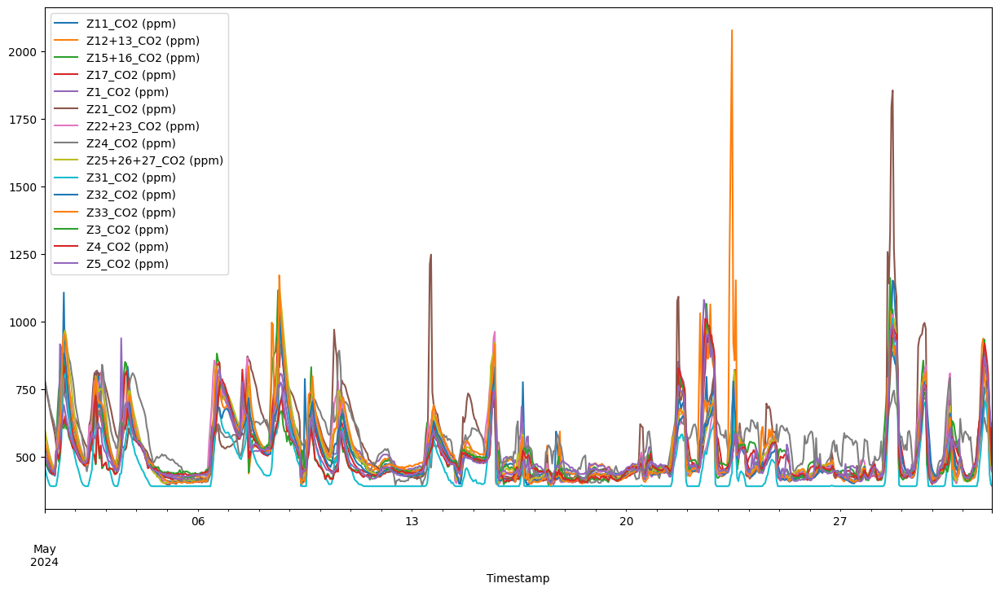

In [20]:
# Then, group by year and week number and apply Mahalanobis distance function
for (year, month), group in Zone_CO2.groupby([Zone_CO2.index.year, Zone_CO2.index.month]):

    group.plot(figsize=(15, 8))

In [21]:
#Missing data check
# Detecting rows with repeated values
repeated_index = (Zone_CO2.diff() == 0).all(axis=1)
repeated_rows = Zone_CO2[repeated_index]

# Now let's get the index of the repeated rows
repeated_rows_index = repeated_rows.index.tolist()

repeated_rows_index

[Timestamp('2023-06-13 14:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-07-29 04:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-07-29 05:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 14:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 15:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 16:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 17:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 18:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 19:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 20:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 21:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 22:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-05 23:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-06 00:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-06 01:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-06 02:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-06 03:00:00-0400', tz='US/Eastern'),
 Timestamp('2023-09-06 04:00:00

In [22]:
Zone_CO2[repeated_index] = np.nan

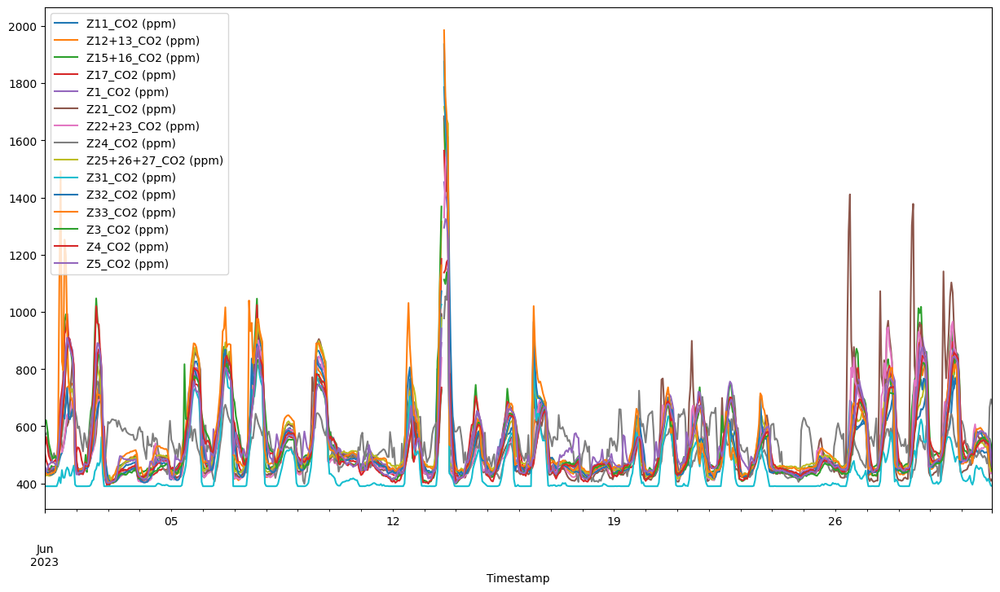

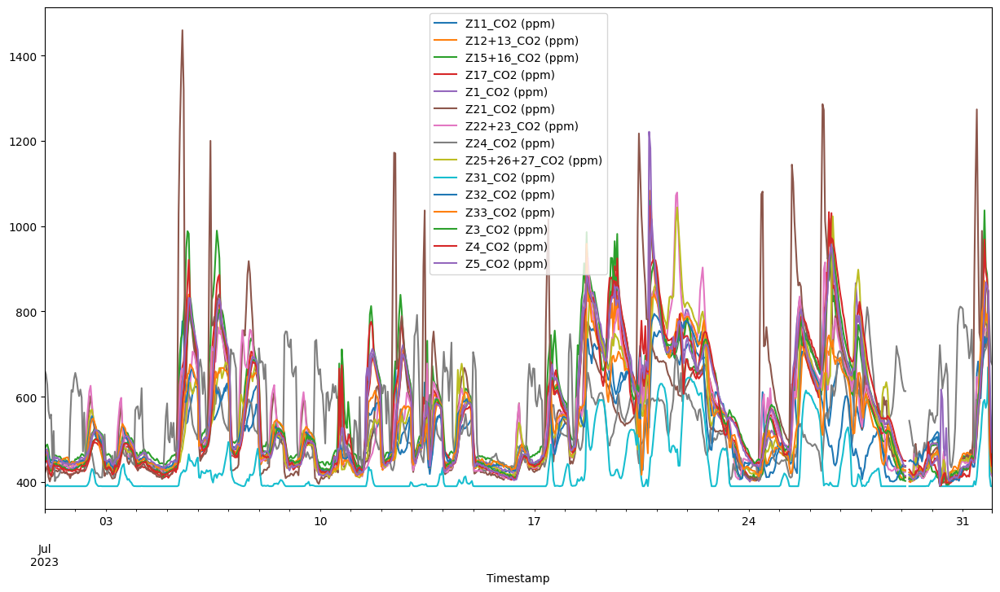

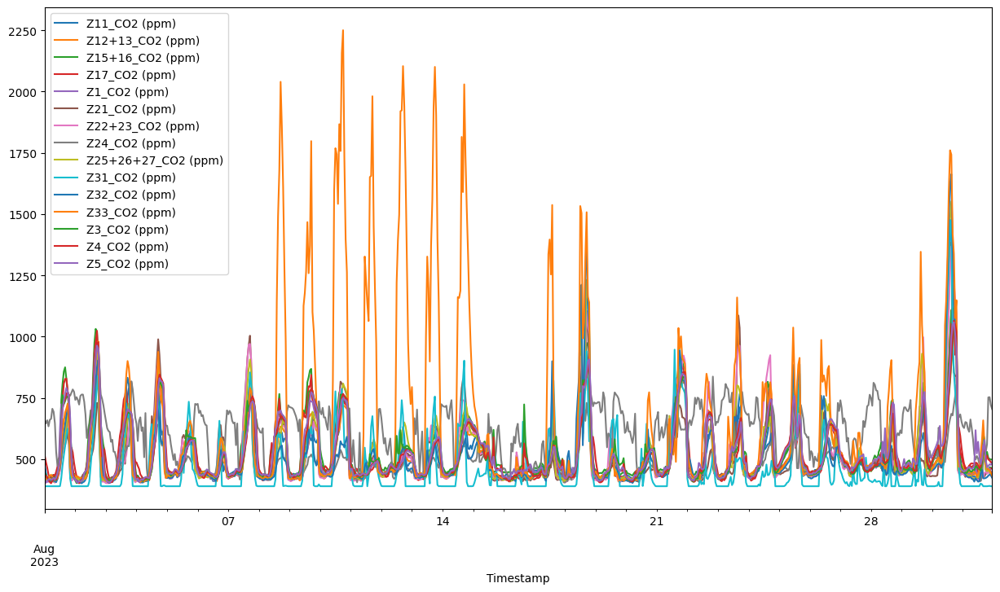

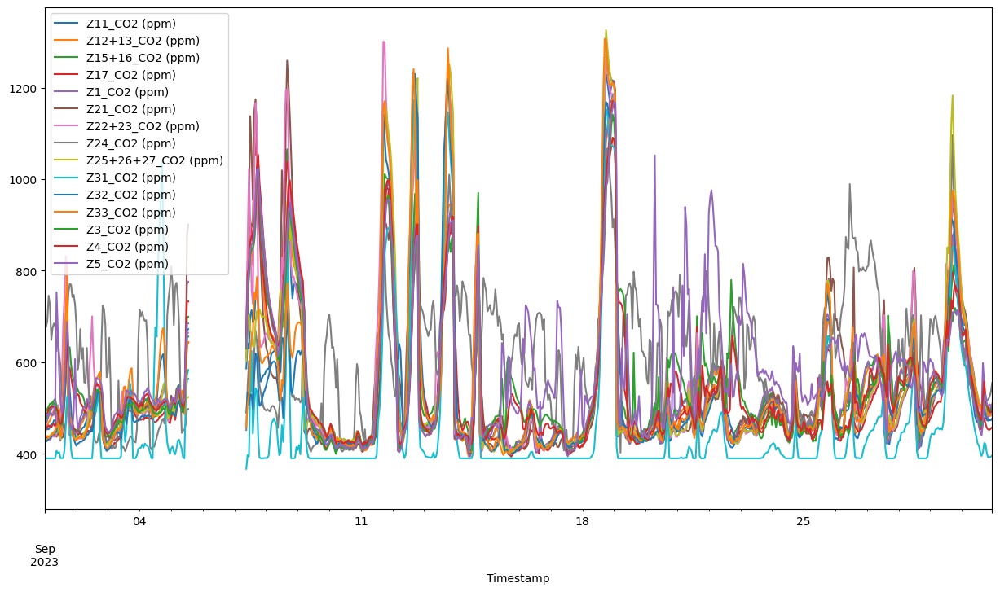

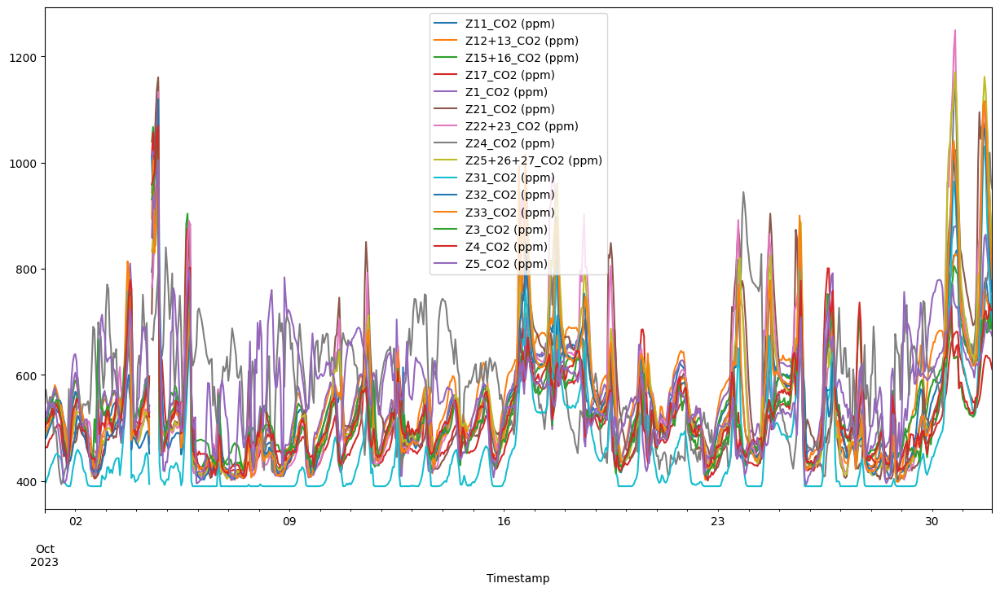

...

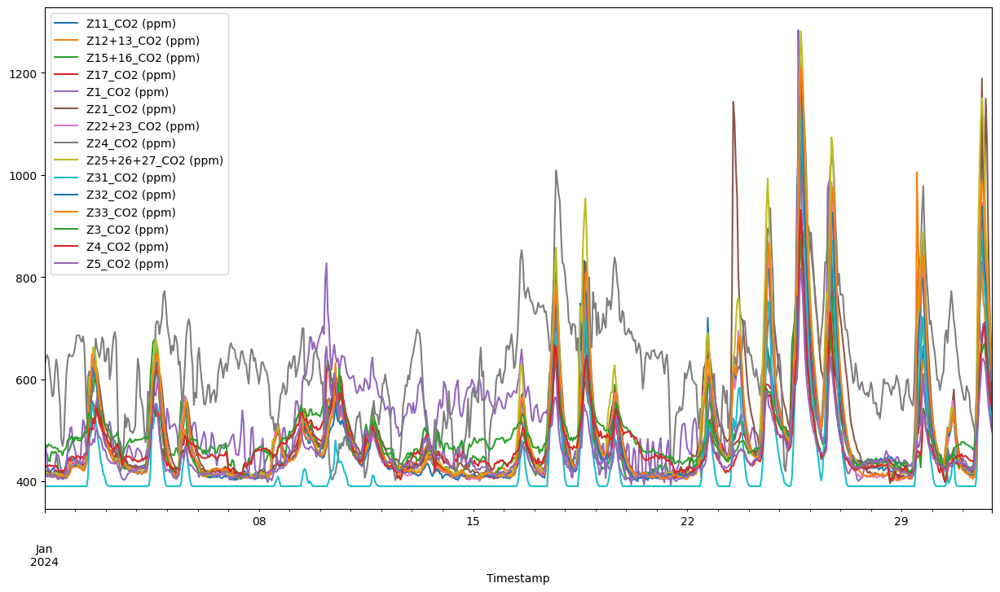

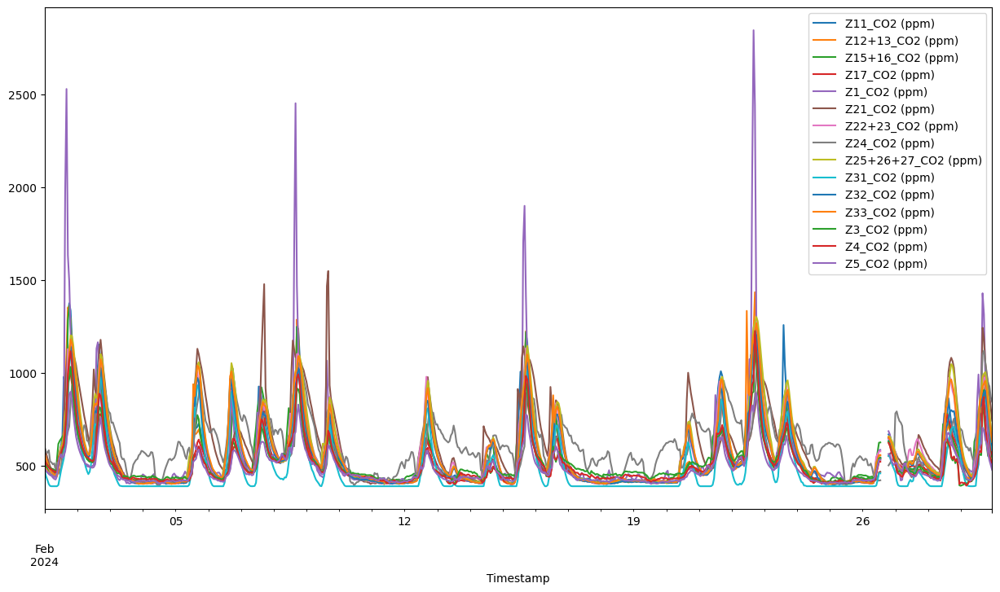

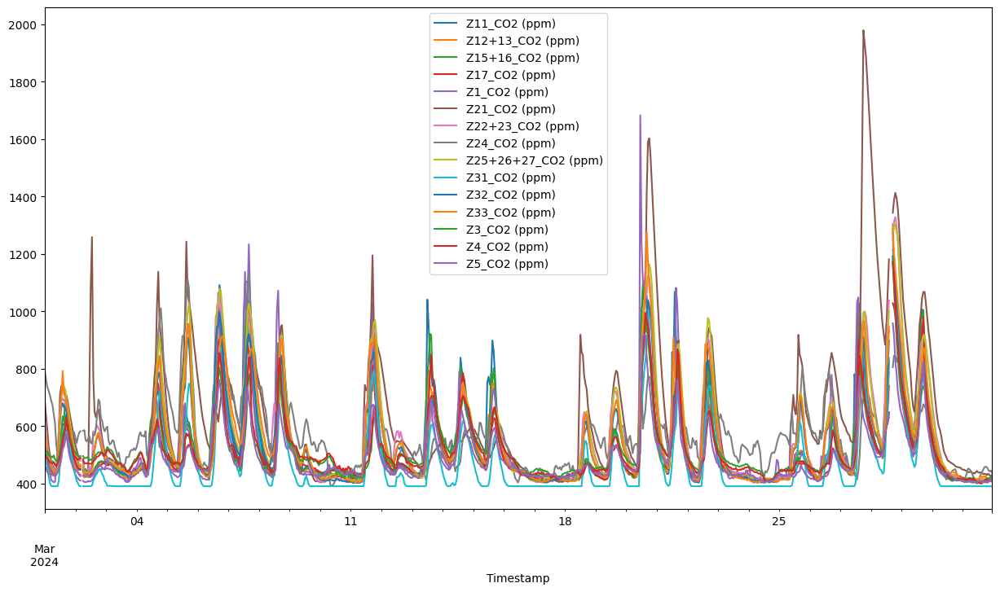

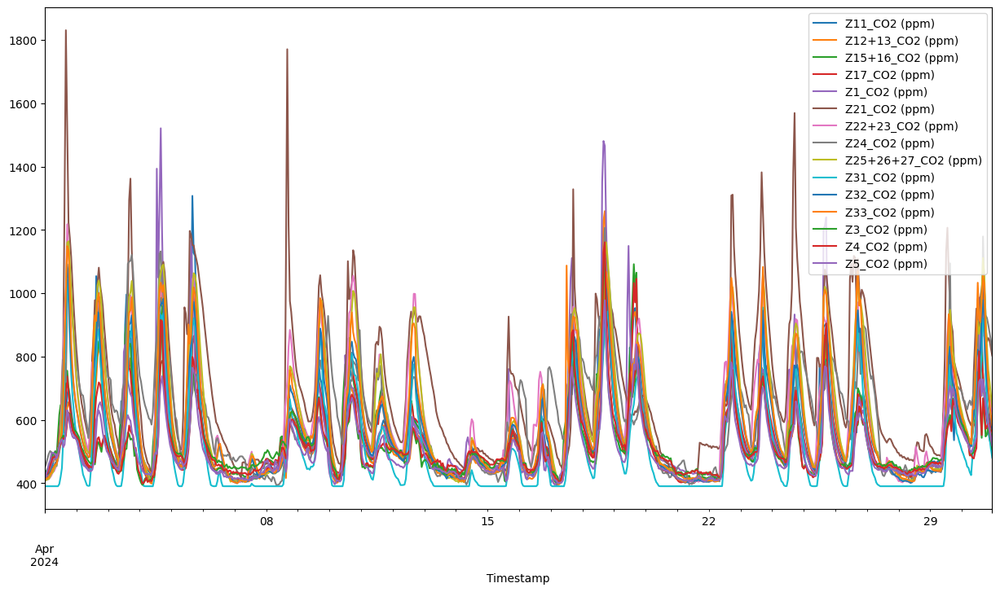

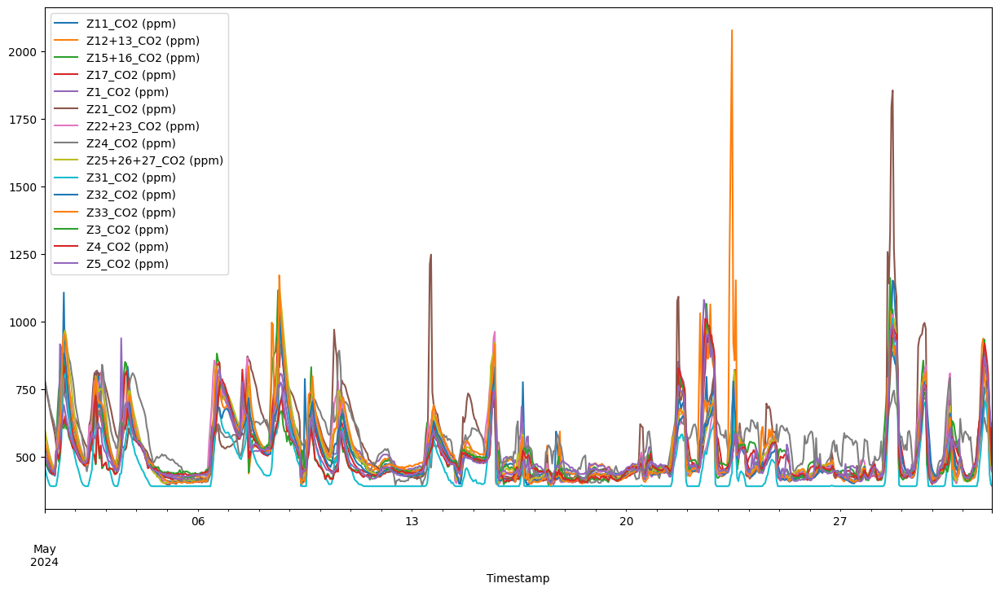

In [23]:
# Then, group by year and week number and apply Mahalanobis distance function
for (year, month), group in Zone_CO2.groupby([Zone_CO2.index.year, Zone_CO2.index.month]):

    group.plot(figsize=(15, 8))

In [24]:
def find_nan_sequences(series):
    is_nan = series.isna()
    if is_nan.any():
        start = end = None
        for i, val in enumerate(is_nan):
            if val and start is None:
                start = i
            elif not val and start is not None:
                end = i - 1
                yield (series.index[start], series.index[end])
                start = end = None
        if start is not None:
            yield (series.index[start], series.index[-1])

# Find and print start and end indices of NaN sequences in each column
empDF = pd.DataFrame()
LstN = []
LstS = []
LstE = []

for column in Zone_CO2.columns:
    for start, end in find_nan_sequences(Zone_CO2[column]):
        print(f"Missing period:'{column}' from {start} to {end}")
        LstN.append(column)
        LstS.append(start)
        LstE.append(end)
        
empDF["names"] = LstN
empDF["start"] = LstS
empDF["end"] = LstE

Missing period:'Z11_CO2 (ppm)' from 2023-06-13 14:00:00-04:00 to 2023-06-13 14:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2023-07-29 04:00:00-04:00 to 2023-07-29 05:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2023-09-05 14:00:00-04:00 to 2023-09-06 16:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2023-09-06 18:00:00-04:00 to 2023-09-07 08:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2023-10-04 11:00:00-04:00 to 2023-10-04 11:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2023-11-08 15:00:00-05:00 to 2023-11-08 16:00:00-05:00
Missing period:'Z11_CO2 (ppm)' from 2024-02-26 14:00:00-05:00 to 2024-02-26 18:00:00-05:00
Missing period:'Z11_CO2 (ppm)' from 2024-03-02 05:00:00-05:00 to 2024-03-02 05:00:00-05:00
Missing period:'Z11_CO2 (ppm)' from 2024-03-28 15:00:00-04:00 to 2024-03-28 16:00:00-04:00
Missing period:'Z12+13_CO2 (ppm)' from 2023-06-13 14:00:00-04:00 to 2023-06-13 14:00:00-04:00
Missing period:'Z12+13_CO2 (ppm)' from 2023-07-29 04:00:00-04:00 to 2023-07-29 05:00:00

In [25]:
Zone_CO2.isna().sum()

Z11_CO2 (ppm)          56
Z12+13_CO2 (ppm)       56
Z15+16_CO2 (ppm)       56
Z17_CO2 (ppm)          56
Z1_CO2 (ppm)           56
Z21_CO2 (ppm)          56
Z22+23_CO2 (ppm)       56
Z24_CO2 (ppm)          56
Z25+26+27_CO2 (ppm)    56
Z31_CO2 (ppm)          56
Z32_CO2 (ppm)          56
Z33_CO2 (ppm)          56
Z3_CO2 (ppm)           56
Z4_CO2 (ppm)           56
Z5_CO2 (ppm)           56
dtype: int64

In [27]:
empDF.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Missing Intervals\Year4\Missing_periods_CO2_Year4.csv', index=False)

In [29]:
Zone_CO2.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Processed\Desigo\Year4\Zone_CO2_Year4.csv', index=True)